In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.datasets import CocoCaptions
from torchvision.datasets import CocoDetection

In [2]:
path_data = "../coco/images/train2017"
path_json_detection ="../coco/annotations/instances_train2017.json"
path_json_caption = "../coco/annotations/captions_train2017.json"

dataset = CocoDetection(path_data, path_json_detection)
dataset_caption = CocoCaptions(path_data, path_json_caption)

loading annotations into memory...
Done (t=6.85s)
creating index...
index created!
loading annotations into memory...
Done (t=0.38s)
creating index...
index created!


In [25]:
print(f'Number of samples: {len(dataset)}')

Number of samples: 118287


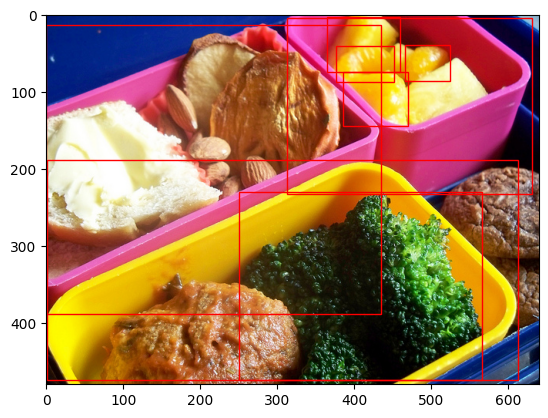

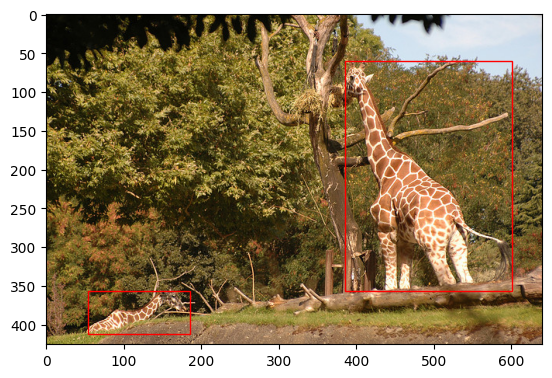

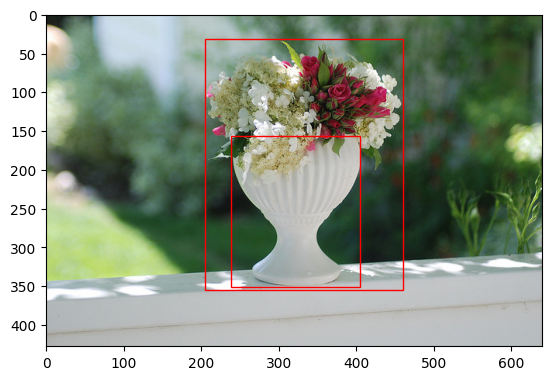

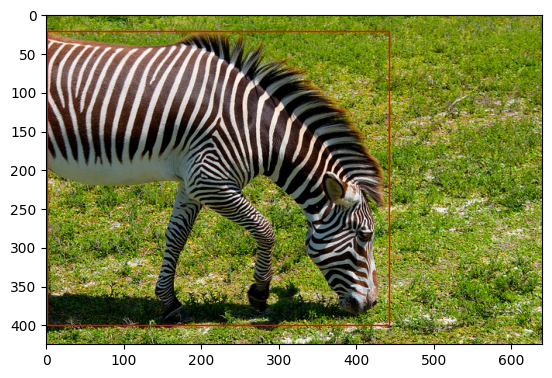

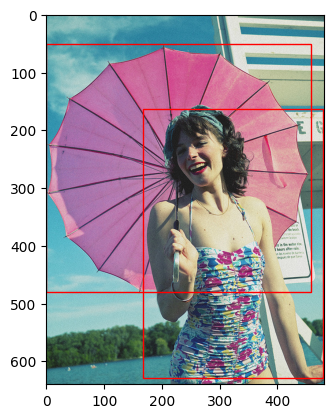

In [27]:
for x in range(len(dataset))[:5]:
    img, target = dataset[x]
    fig, ax = plt.subplots()
    ax.imshow(img)

    for tgt in target:
        rect = patches.Rectangle((tgt['bbox'][0], tgt['bbox'][1]), tgt['bbox'][2], tgt['bbox'][3], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

In [10]:
img, target = dataset_caption[0]

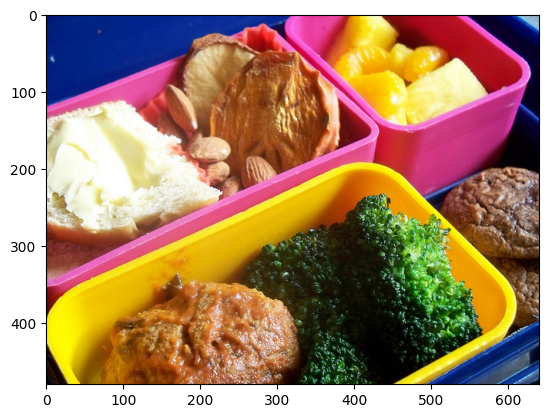

In [11]:
plt.imshow(img)

In [12]:
target

['Closeup of bins of food that include broccoli and bread.',
 'A meal is presented in brightly colored plastic trays.',
 'there are containers filled with different kinds of foods',
 'Colorful dishes holding meat, vegetables, fruit, and bread.',
 'A bunch of trays that have different food.']

In [2]:
import os
import pylab
import requests

import numpy as np
# import skimage.io as io
import matplotlib.pyplot as plt

from PIL import Image
from io import BytesIO
from pycocotools.coco import COCO

pylab.rcParams['figure.figsize'] = (8.0, 10.0)

annFile = '../coco/annotations/instances_train2017.json'

In [3]:
coco=COCO(annFile)

loading annotations into memory...
Done (t=6.88s)
creating index...
index created!


In [4]:
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories: \n{}\n'.format(' '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories: \n{}'.format(' '.join(nms)))
print(nms)

COCO categories: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush

COCO supercategories: 
outdoor appliance kitchen furniture person food vehicle sports electronic indoor animal accessory
{'outdoor', 'appliance', 'kitchen', 'furniture', 'person', 'food', 'vehicle', 'sports', 'electronic', 'indoor', 'animal', 'accessory'}


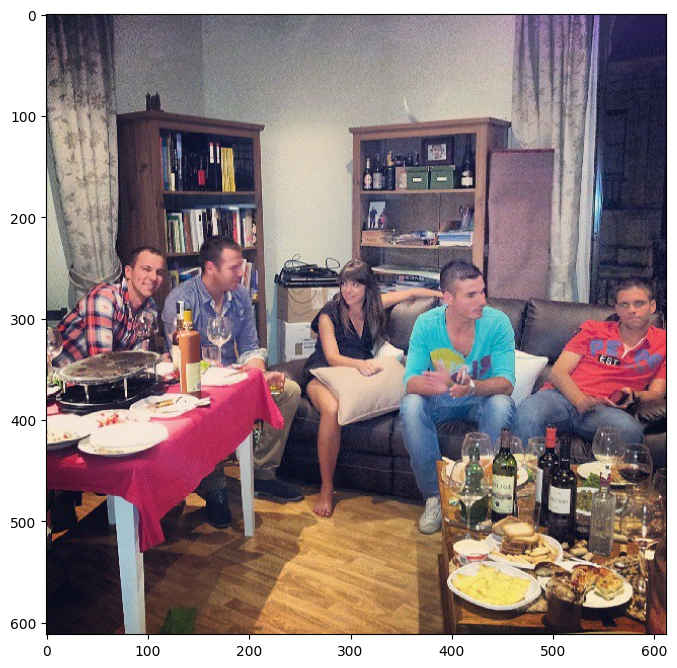

In [5]:
catIds = coco.getCatIds(catNms=cats)
imgIds = coco.getImgIds(catIds=catIds)
catIds = coco.getCatIds(catIds=list(nms))
imgIds = coco.getImgIds(catIds=catIds)

# imgIds = coco.getImgIds(imgIds = [324158])
img = coco.loadImgs(imgIds[np.random.randint(0,len(imgIds))])[0]
response = requests.get(img['coco_url'])
I = Image.open(BytesIO(response.content))

plt.imshow(I)
plt.show()

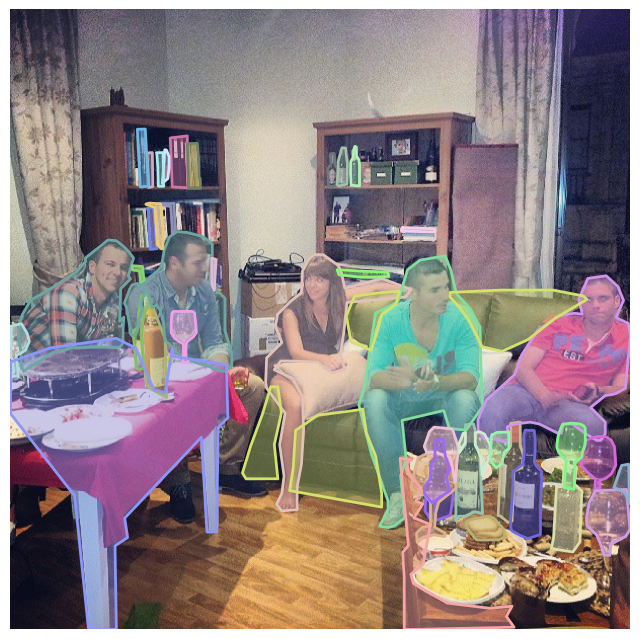

In [6]:
plt.imshow(I)
plt.axis('off')
annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)

In [7]:
anns

[{'segmentation': [[442.45,
    500.24,
    449.07,
    500.24,
    457.89,
    495.83,
    465.98,
    497.3,
    463.04,
    438.48,
    458.63,
    428.92,
    458.63,
    415.69,
    457.16,
    409.07,
    449.07,
    409.8,
    449.07,
    429.66,
    440.25,
    440.68,
    439.51,
    504.65]],
  'area': 1803.9438000000016,
  'iscrowd': 0,
  'image_id': 442298,
  'bbox': [439.51, 409.07, 26.47, 95.58],
  'category_id': 44,
  'id': 84681},
 {'segmentation': [[481.25,
    499.55,
    483.93,
    445.98,
    493.75,
    430.81,
    493.75,
    408.49,
    503.13,
    407.15,
    503.13,
    429.47,
    506.25,
    440.18,
    504.91,
    452.23,
    496.88,
    455.8,
    495.09,
    504.9,
    491.07,
    506.24,
    483.49,
    499.99]],
  'area': 1314.9148499999992,
  'iscrowd': 0,
  'image_id': 442298,
  'bbox': [481.25, 407.15, 25.0, 99.09],
  'category_id': 44,
  'id': 87856},
 {'segmentation': [[495.2,
    514.91,
    504.65,
    519.84,
    510.81,
    522.3,
    523.14,
 

In [8]:
path_data = "../coco/images/train2017"
path_json_detection ="../coco/annotations/instances_train2017.json"

dataset = CocoDetection(path_data, path_json_detection)

loading annotations into memory...
Done (t=7.35s)
creating index...
index created!


In [10]:
img, target = dataset[0]

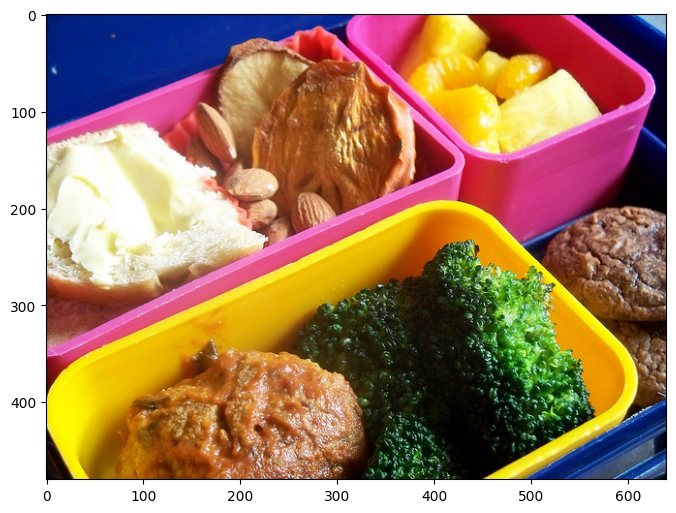

In [11]:
plt.imshow(img)

In [20]:
img.size

(640, 480)

In [37]:
print(len(target))

8


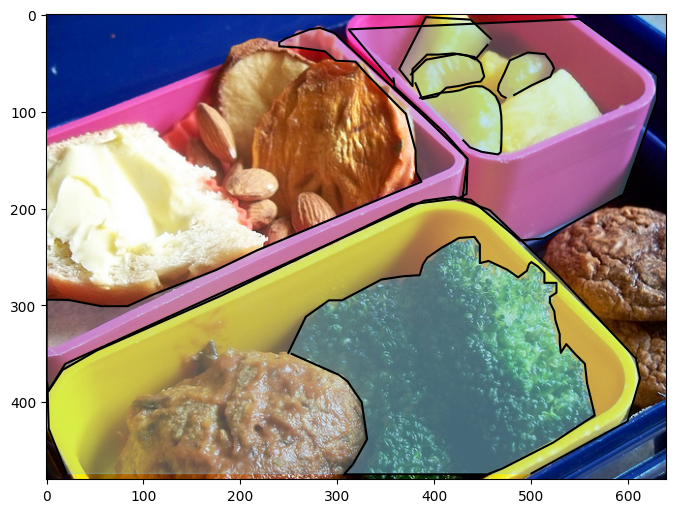

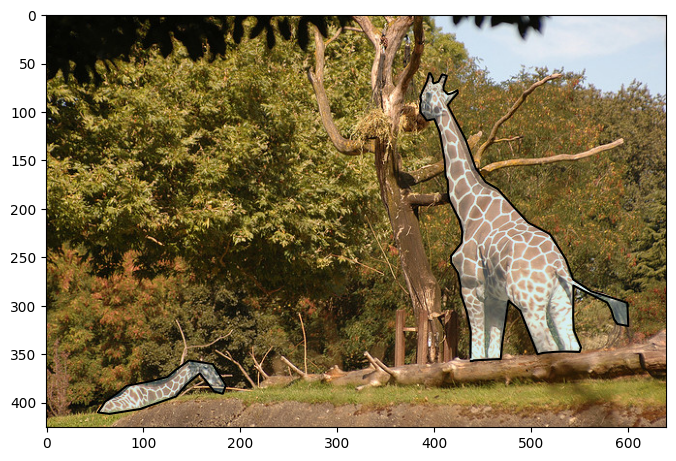

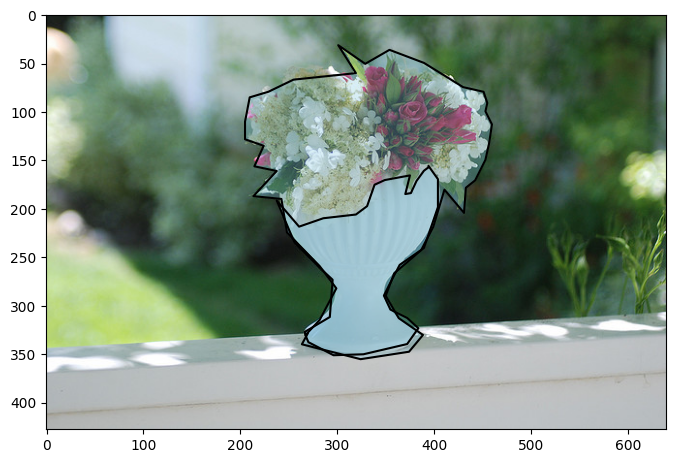

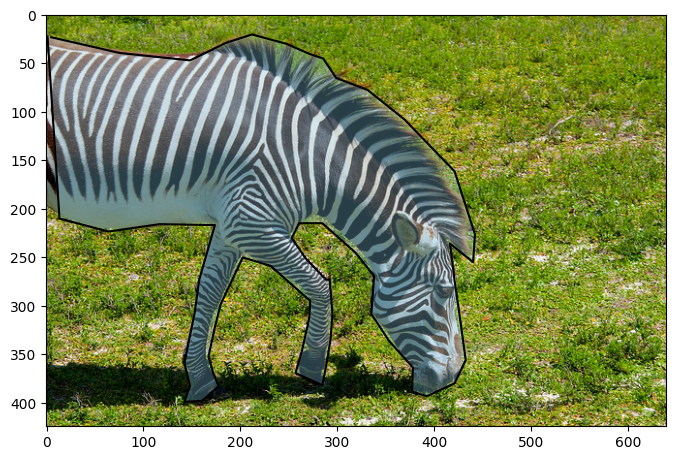

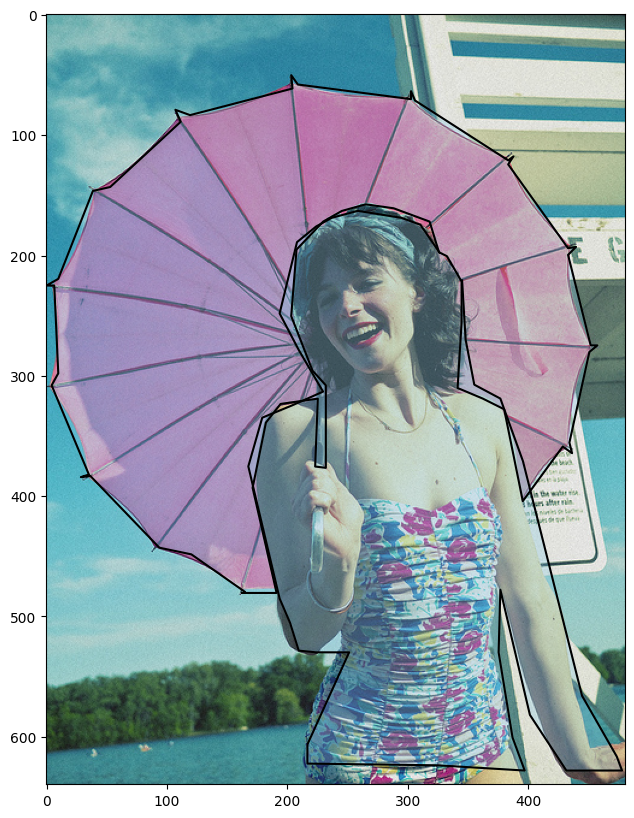

In [47]:
for x in range(len(dataset))[:5]:
    img, target = dataset[x]
    fig, ax = plt.subplots()
    ax.imshow(img)

    for items in target:
        points = items['segmentation'][0]
        x_points = points[0::2]
        y_points = points[1::2] 
        ax.fill(x_points, y_points, color='skyblue', alpha=0.3)
        plt.plot(x_points, y_points, color='black')